In [265]:
import numpy as np
import matplotlib.pyplot as plt
from dask_quantumtinkerer import Cluster, cluster_options
import itertools as it
import scipy.sparse.linalg as sla
from collections import OrderedDict
import dask.bag as db

import ccode.solvers as sl
import ccode.kpm as kpm
from ccode.tools import separate_energies_wfs, get_potential, find_resonances
from ccode.plotting import plot_gates, plot_potential_at_barriers, multiline
from ccode.triangular_gates_1 import *
from scipy.sparse import csc_matrix

import matplotlib as mpl
mpl.rcParams.update({'font.size': 16})

In [55]:
def tunnel_crossing(learner, mu, index, tol=1e-4):
    gathered_potentials = {}
    for key, value in learner.extra_data.items():
        gathered_potentials[key] = value['potential']

    crossings = []
    for key, value in gathered_potentials.items():
        if np.abs(value[index]-mu) < tol:
            crossings.append(key)

    return np.array(crossings)[:, ::-1]


def prepare_voltages(x, elements, fixed_gates={}):
    voltages = OrderedDict()
    for i, element in enumerate(elements):
        voltages[str(element)] = x[i]

    for key, value in fixed_gates.items():
        voltages[key] = value

    return voltages

In [3]:
np.warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)
mu = sl.bands[0]

In [4]:
from ccode.tools import find_cuts

def plot_potential_at_barriers(
    volts, potentials, mu, color_label, title='Potential cut along barriers'
):
    yint = 1e3*volts
    x, potential_cuts_bot = find_cuts(potentials, cut=10e-9)
    potential_cuts_bot = np.array(potential_cuts_bot)
    xs = np.array([x for i in range(len(potential_cuts_bot))])

    fig, ax = plt.subplots(figsize=(10, 4))
    lc1 = multiline(1e9*xs, -1e3*(potential_cuts_bot-mu), yint, cmap='viridis', lw=0.3, ax=ax)

    axcb = fig.colorbar(lc1)
    axcb.set_label(color_label, fontsize=13)
    ax.set_title(title)
    ax.set_ylabel(r'$V-\mu_0$ [mV]')
    ax.set_xlabel(r'x [nm]')
    plt.show()

In [5]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 8
options.extra_path = "/home/jtorresluna/trijunction_design/"

# Gate configuration

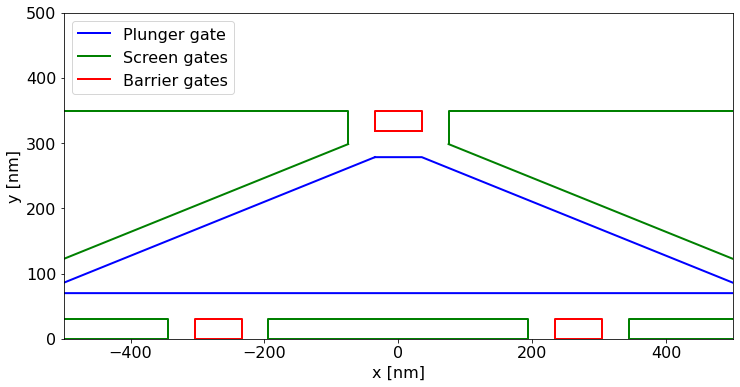

In [6]:
plot_gates(gates);

# Potential setup

In [133]:
def get_voltage_setup_LR():

    depleted = -0.015

    screen_voltages = {
        'left_screen_triangle': depleted,
        'right_screen_triangle': depleted,
        'central_screen_gate': depleted*1.5,
        'left_screen_side': depleted,
        'right_screen_side': depleted,
        'left_screen': depleted,
        'right_screen': depleted
    }

    tunel_voltages = {
        'top_tunel': -0.01,#0.095,
        'left_tunel': 0.022,#-0.07,
        'right_tunel': 0.022 #0.1
    }

    plunger_voltages = {'plunger_gate': 0.007}

    voltage_setup_LR = dict()
    voltage_setup_LR.update(screen_voltages)
    voltage_setup_LR.update(tunel_voltages)
    voltage_setup_LR.update(plunger_voltages)

    volt = list(voltage_setup_LR.values())
    gates = list(voltage_setup_LR.keys())
    voltage_setup_LR = prepare_voltages(volt, gates)

    return voltage_setup_LR

In [127]:
def get_voltage_setup_LC():
    depleted = -0.015

    screen_voltages = {
        'left_screen_triangle': depleted,
        'right_screen_triangle': depleted,
        'central_screen_gate': depleted*1.5,
        'left_screen_side': depleted,
        'right_screen_side': depleted,
        'left_screen': depleted,
        'right_screen': depleted
    }

    tunel_voltages = {
        'top_tunel': 0.022,#0.095
        'left_tunel': 0.022,#-0.07,
        'right_tunel': -0.02 #0.1
    }

    plunger_voltages = {'plunger_gate': 0.006}

    voltage_setup_LC = dict()
    voltage_setup_LC.update(screen_voltages)
    voltage_setup_LC.update(tunel_voltages)
    voltage_setup_LC.update(plunger_voltages)

    volt = list(voltage_setup_LC.values())
    gates = list(voltage_setup_LC.keys())
    voltage_setup_LC = prepare_voltages(volt, gates)

    return voltage_setup_LC

In [128]:
def get_voltage_setup_all():

    depleted = -0.015

    screen_voltages = {
        'left_screen_triangle': depleted,
        'right_screen_triangle': depleted,
        'central_screen_gate': depleted*1.5,
        'left_screen_side': depleted,
        'right_screen_side': depleted,
        'left_screen': depleted,
        'right_screen': depleted
    }

    tunel_voltages = {
        'top_tunel': 0.02,#0.095,
        'left_tunel': 0.02,#-0.07,
        'right_tunel': 0.02 #0.1
    }

    plunger_voltages = {'plunger_gate': 0.006}

    voltage_setup_CR = dict()
    voltage_setup_CR.update(screen_voltages)
    voltage_setup_CR.update(tunel_voltages)
    voltage_setup_CR.update(plunger_voltages)

    volt = list(voltage_setup_CR.values())
    gates = list(voltage_setup_CR.keys())
    voltage_setup_CR = prepare_voltages(volt, gates)

    return voltage_setup_CR


In [129]:
def plot_potential_as(file, potential=[], cmap="gist_heat_r", scale=1, **kwargs):

    total_potential = []
    for element in potential:
        coordinates = np.array(list(element.keys()))
        values = np.array(list(element.values()))
        total_potential.append(values)

    x = scale*coordinates[:, 0]
    y = scale*coordinates[:, 1]
    width = np.unique(x).shape[0]
    X = x.reshape(width, -1)
    Y = y.reshape(width, -1)
    Z = sum(total_potential).reshape(width, -1)

    fig = plt.figure(figsize=(15, 5))
    ax1 = fig.add_subplot(121)
    cont = ax1.contour(X, Y, 1e3*Z, cmap=cmap, levels=100, **kwargs)
    cbar1 = fig.colorbar(cont, ax=ax1, format="%.2f")
    cbar1.set_label(r'$V_{eqipot}$ [mV]')
    ax1.set_xlabel("X [nm]")
    ax1.set_ylabel("Y [nm]")
    plt.savefig(file)

In [134]:
voltage_setup = get_voltage_setup_LR()

clean_potential = potential(voltage_setup=voltage_setup)
clean_potential.update(
    (key, -1 * value) for key, value in clean_potential.items()
)

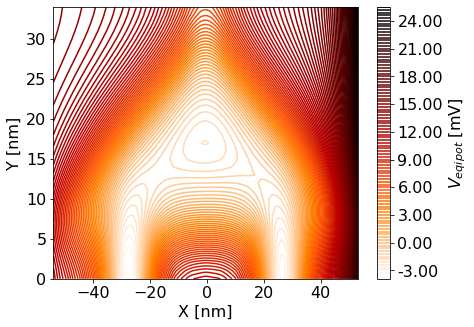

In [135]:
plot_potential_as(potential=[clean_potential], file='../data/manuscript/device_2_all_equipot.pdf')

In [13]:
voltage_setup = get_voltage_setup_LC()
#voltage_setup['right_tunel'] = -0.05

clean_potential = potential(voltage_setup=voltage_setup)
clean_potential.update(
    (key, -1 * value) for key, value in clean_potential.items()
)

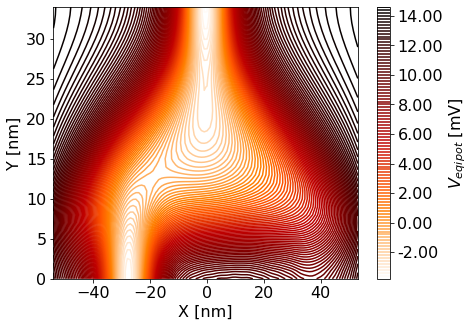

In [14]:
plot_potential_as(potential=[clean_potential], file='../data/manuscript/device_2_LC_equipot.pdf')

# Set up trijunction

(-1e-07, 4.4e-07)

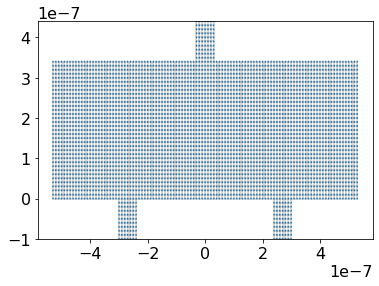

In [15]:
fig, ax = plt.subplots()
kwant.plot(trijunction, ax=ax);
ax.set_ylim(-1e-7, 4.4e-7)

In [80]:
center = 28*10e-9
top = 34*10e-9
barriers = [(center, 10e-9), (-center, 10e-9), (0, top)]

## Optimal phases

In [23]:
solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=get_voltage_setup_all(),
                               key='plunger_gate',
                               n=20,
                               eigenvecs=False)


def wrapper(arg):
    return solver(*arg)

In [24]:
plunger = 1e-3
phis = np.linspace(0, 2*np.pi, 100)

max_phis = []

with Cluster(options) as cluster:
    cluster.scale(n=20)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    for pair in range(3):
        phases_params = []
        for phi in phis:
            phases_params.append(sl.finite_coupling_parameters(index=0, phis=phi*np.ones(3))[pair])

        args = list(it.product([plunger], phases_params))
        args_db = db.from_sequence(args, npartitions=20)
        result = args_db.map(wrapper).compute()

        ens, _ = separate_energies_wfs(result)
        phi_max = phis[np.argmax(ens.T[11])]
        max_phis.append(phi_max)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/80548a6cff8648bf9c3fadf35801592b/status


In [25]:
np.array(max_phis)/np.pi

array([1.73737374, 0.3030303 , 1.6969697 ])

# Left - Right MBS

## Adaptive map

In [26]:
import adaptive
from operator import itemgetter
adaptive.notebook_extension()

In [56]:
def f_line(start, end):
    def f(x):
        m = (end[1]-start[1])/(end[0]-start[0])
        b = start[1] - m*start[0]
        return m*x + b
    return np.vectorize(f)

In [28]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(phi1=max_phis[0])

### Plunger vs tunel gates

In [29]:
voltage_setup_LR = get_voltage_setup_LR()

In [30]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [31]:
%%time
f((0,0))

CPU times: user 3.63 s, sys: 92.7 ms, total: 3.73 s
Wall time: 3.72 s


{'eigenvalues': 8.597807862312626e-07,
 'potential': array([-0.00961914, -0.01157724, -0.00777477])}

In [32]:
plunger_min = 2e-3
plunger_max = 10e-3

tunel_min = 0
tunel_max = 40e-3

In [255]:
cluster = Cluster(options)
cluster.scale(n=20)
client = cluster.get_client()
client.wait_for_workers(n_workers=1)
print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/736685d52fd44038b8296a9485ac2f8a/status


In [34]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.01, executor=client)

In [35]:
runner.live_info()

distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'f-b6235cbb6e29ebf4f12eab2c752d0473': ()}
tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x7f7ccad51160>>, <Future finished exception=CancelledError('f-b6235cbb6e29ebf4f12eab2c752d0473')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line 769, in run
    yielded = self.gen.throw(*exc_info)  # type: ignore
  File "/opt/conda/lib/python3.9/site-packages/distributed/cfexecutor.py", line 19, in _cascade_future
    result = yield future._result(raiseit=False)
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line

In [36]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [37]:
data_LR[0].shape

(247, 247)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

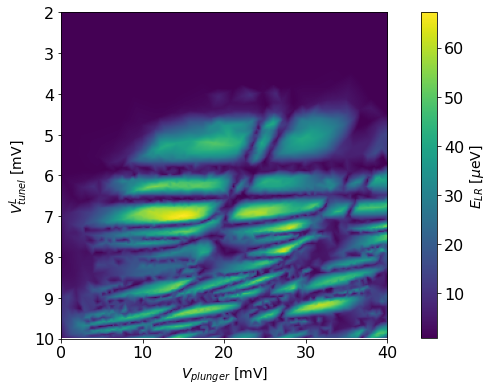

In [38]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min), aspect=5)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_ylabel(r'$V_{tunel}^L$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)

x = np.array([0, 40])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-4)
crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=1e-4)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[3])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

ax.set_ylim(10, 2)
ax.set_xlim(0, 40)

#ax.scatter(crossings_L_0.T[0]*1e3, crossings_L_0.T[1]*1e3)
#ax.scatter(crossings_L_mu.T[0]*1e3, crossings_L_mu.T[1]*1e3)
ax.legend(fontsize=13)

ax.set_title(r'Left tunnel gate and plunger gate', fontsize=13)

### Left vs Right tunnel gates

In [81]:
voltage_setup_LR = get_voltage_setup_LR()
voltage_setup_LR['plunger_gate'] = 0.007

In [82]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='right_tunel',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [83]:
%%time
f((0,0))

CPU times: user 1.19 s, sys: 123 ms, total: 1.31 s
Wall time: 1.31 s


{'eigenvalues': 5.6790299476873355e-06,
 'potential': array([-0.00327534, -0.00321286, -0.00660428])}

In [84]:
tunel_min = -10e-3
tunel_max = 30e-3

In [258]:
cluster.scale(n=40)

In [85]:
data_LR_tunnels = []
_learner = adaptive.Learner2D(f, bounds=[(tunel_min, tunel_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.003, executor=client)

In [86]:
runner.live_info()

In [87]:
_, _, z = learner.interpolated_on_grid()
data_LR_tunnels.append(z)

In [88]:
data_LR_tunnels[0].shape

(303, 303)

In [115]:
mu = bands[0]
mu

0.0023960204649275973

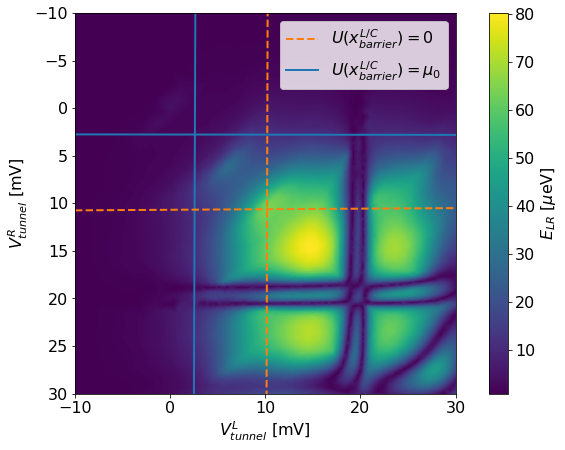

In [124]:
fig, ax = plt.subplots(figsize=(12, 7))

p = ax.imshow(1e6*data_LR_tunnels[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*tunel_max, 1e3*tunel_min))
ax.set_ylabel(r'$V_{tunnel}^{R}$ [mV]')
ax.set_xlabel(r'$V_{tunnel}^{L}$ [mV]')
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]')

x = np.array([-10, 30])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-5)
crossings_R_0 = tunnel_crossing(learner, mu=0, index=0, tol=1e-5)

crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=1e-5)
crossings_R_mu = tunnel_crossing(learner, mu=-mu, index=0, tol=1e-4)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[-1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[-1])
ax.plot(x, f_L_0(x), label=r'$U(x^{L/C}_{barrier}) = 0$', color='C1', lw=2, linestyle='--')
ax.plot(x, f_L_mu(x), label=r'$U(x^{L/C}_{barrier}) = \mu_0$', color='C0', lw=2)

#ax.plot(f_L_0(x), x, label=r'$V_L = 0$', color='orange', lw=2)
#ax.plot(f_L_mu(x), x, label=r'$V_L = \mu_0$', color='red', lw=2)

f_R_0 = f_line(1e3*crossings_R_0[0], 1e3*crossings_R_0[-1])
f_R_mu = f_line(1e3*crossings_R_mu[0], 1e3*crossings_R_mu[-1])
ax.plot(x, f_R_0(x), color='C1', lw=2, linestyle='--')
ax.plot(x, f_R_mu(x), color='C0', lw=2)

#ax.scatter(*crossings_L_0.T*1e3)
#ax.scatter(*crossings_R_mu.T*1e3)

#ax.scatter(*crossings_L_mu.T*1e3)
#ax.scatter(*crossings_R_0.T*1e3)

#ax.scatter(crossings_L_0.T[0]*1e3, crossings_L_0.T[1]*1e3)
#ax.scatter(crossings_L_mu.T[0]*1e3, crossings_L_mu.T[1]*1e3)

ax.set_ylim(30, -10)

ax.legend(loc='upper right')
plt.savefig('../data/manuscript/device_2_LR_barriers.pdf', bbox_inches='tight')

### Screen gates

In [125]:
voltage_setup_LR = get_voltage_setup_LR()
voltage_setup_LR['left_tunel'] = 15e-3
voltage_setup_LR['right_tunel'] = 15e-3
voltage_setup_LR['plunger_gate'] = 0.007

In [136]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='left_screen_triangle',
                              val_1=v_plunger, 
                              key_2='right_screen_triangle',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [137]:
%%time
f((0,0))

CPU times: user 1.41 s, sys: 82.3 ms, total: 1.49 s
Wall time: 1.48 s


{'eigenvalues': 1.2165566302426476e-05,
 'potential': array([ 0.00237783,  0.00249997, -0.00157496])}

In [146]:
screen_min = -40e-3
screen_max = 10e-3

In [35]:
cluster.scale(n=40)

In [153]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(screen_min, screen_max), (screen_min, screen_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.003, executor=client)

In [154]:
runner.live_info()

In [155]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [156]:
data_LR[0].shape

(460, 460)

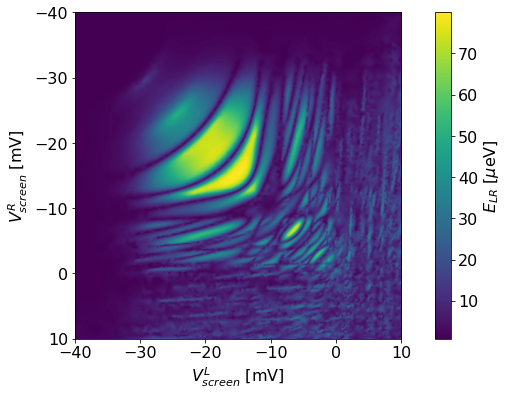

In [159]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*screen_min, 1e3*screen_max, 1e3*screen_max, 1e3*screen_min))
ax.set_ylabel(r'$V_{screen}^R$ [mV]')
ax.set_xlabel(r'$V_{screen}^L$ [mV]')
cb = plt.colorbar(p, ax=ax)

cb.set_label(r'$E_{LR}$ [$\mu$eV]')

plt.savefig('../data/manuscript/device_2_LR_screens.pdf', bbox_inches='tight')

## Plunger gate dependence

In [864]:
voltage_setup = get_voltage_setup_LR()

In [865]:
key = 'plunger_gate'
volts = np.linspace(0.004, 0.0086, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

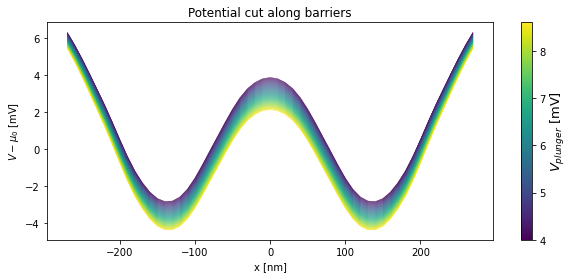

In [866]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu, color_label=r'$V_{plunger}$ [mV]')

In [275]:
key = 'plunger_gate'
volts = np.linspace(3e-3, 7e-3, 100)

In [276]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(phi2=max_phis[0])

In [278]:
voltage_setup = get_voltage_setup_LR()
voltage_setup['left_screen_triangle'] = -15e-3
voltage_setup['right_screen_triangle'] = -15e-3
voltage_setup['left_tunel'] = 15e-3
voltage_setup['center_tunel'] = 15e-3
voltage_setup

OrderedDict([('left_screen_triangle', -0.015),
             ('right_screen_triangle', -0.015),
             ('central_screen_gate', -0.0225),
             ('left_screen_side', -0.015),
             ('right_screen_side', -0.015),
             ('left_screen', -0.045),
             ('right_screen', -0.015),
             ('top_tunel', -0.01),
             ('left_tunel', 0.015),
             ('right_tunel', 0.022),
             ('plunger_gate', 0.007),
             ('center_tunel', 0.015)])

In [279]:
n = 20

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               key=key,
                               n=n,
                               eigenvecs=False)


def wrapper(arg):
    return solver(*arg)


args = list(it.product(volts, [params]))
args_db = db.from_sequence(args, npartitions=20)

In [280]:
result = args_db.map(wrapper).compute()

In [281]:
ens, wfs = separate_energies_wfs(result)

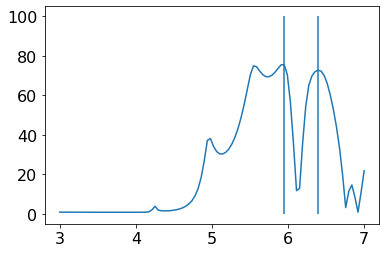

In [282]:
peaks, gs_LR = find_resonances(energies=ens,
                               n=n,
                               i=2,
                               n_peaks=5,
                               prominence=25e-6)

plt.vlines(x=1e3*volts[peaks], ymin=0, ymax=100)
plt.plot(1e3*volts, 1e6*gs_LR)


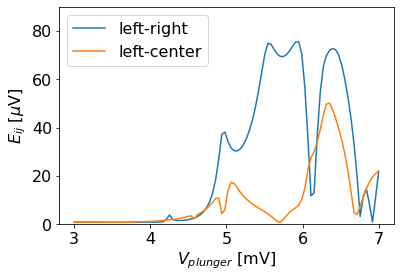

In [284]:
fig, ax = plt.subplots()
ax.plot(1e3*volts, 1e6*gs_LR, label='left-right')
ax.plot(1e3*volts, 1e6*gs_LC, label='left-center')
ax.set_ylim(0, 90)
ax.set_xlabel(r'$V_{plunger}$ [mV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$V]')
ax.legend()
plt.savefig('../data/manuscript/device_2_coupling.pdf', bbox_inches='tight')

In [500]:
cluster.scale(n=20)

In [501]:
%%time
result = args_db.map(solver).compute()

CPU times: user 2.04 s, sys: 72.2 ms, total: 2.12 s
Wall time: 1min 53s


In [502]:
ens_exact_LR_plunger, _ = separate_energies_wfs(result)

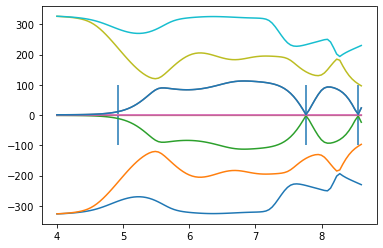

In [513]:
peaks, gs = find_resonances(energies=ens_exact_LR_plunger,
                           n=n,i=2,
                           n_peaks=5, prominence=20e-6)

first_peak = np.where(gs>10e-6)[0][0]
peaks = np.hstack([first_peak, peaks])

fig, ax = plt.subplots()
for level in ens_exact_LR_plunger.T:
    ax.plot(1e3*volts, 1e6*level)

ax.vlines(x=1e3*volts[peaks], ymin=-100, ymax=100)
ax.plot(1e3*volts, 1e6*gs)
#ax.plot(volts_per_level, levels);

In [514]:
averages, widths, centers = average_single_level(ens=ens_exact_LR_plunger, mus=volts)

In [515]:
mean_height = np.round(1e6*np.mean(averages), 2)
mean_width = np.round(1e3*np.mean(widths), 2)

In [517]:
widths

array([0.00283434, 0.0007899 ])

Text(0.5, 0, '$V_{plunger}$ [mV]')

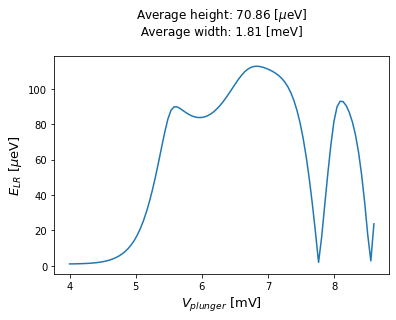

In [520]:
fig, ax = plt.subplots()

title = f'Average height: {mean_height} [$\mu$eV] \n Average width: {mean_width} [meV] \n '
ax.set_title(title)
ax.plot(1e3*volts, 1e6*gs)

ax.set_ylabel(r'$E_{LR}$ [$\mu$eV]', fontsize=13)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=13)

In [507]:
def average_single_level(ens, mus):

    averages = np.array([np.mean(gs[peaks[i]:peaks[i+1]]) for i in range(len(peaks)-1)])
    widths = np.array([mus[peaks[i+1]]-mus[peaks[i]] for i in range(len(peaks)-1)])
    centers = np.array([mus[peaks[i]]+widths[i]/2 for i in range(len(peaks)-1)])
    return averages, np.abs(widths), centers
    

In [425]:
from ccode.tools import find_resonances



# Left - Top MBS

## Adaptive map

In [16]:
import adaptive
from operator import itemgetter
adaptive.notebook_extension()

In [160]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(phi2=max_phis[1])

### Plunger vs tunel gates

In [189]:
voltage_setup_LC = get_voltage_setup_LC()

In [190]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [191]:
%%time
f((0,0))

CPU times: user 3.82 s, sys: 126 ms, total: 3.95 s
Wall time: 3.94 s


{'eigenvalues': 8.596239920424493e-07,
 'potential': array([-0.01185632, -0.00569849,  0.00175176])}

In [192]:
plunger_min = 2e-3
plunger_max = 6e-3

tunel_min = 0
tunel_max = 40e-3

In [101]:
cluster.scale(n=40)

In [193]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.01, executor=client)

In [194]:
runner.live_info()

In [195]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [196]:
data_LR[0].shape

(141, 141)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

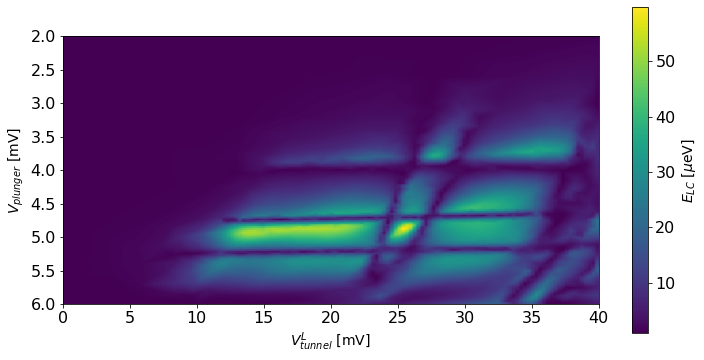

In [198]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=5)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^L$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]', fontsize=14)

x = np.array([0, 50])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-5)
crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=1e-5)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

ax.set_ylim(10, 2)
ax.set_xlim(0, 40)

ax.set_title(r'Left tunnel gate and plunger gate', fontsize=13)
ax.legend(fontsize=13)

### Left vs Top tunnel gates

In [200]:
voltage_setup_LC = get_voltage_setup_LC()
voltage_setup_LC['plunger_gate'] = 0.005
voltage_setup_LC['left_screen_triangle'] = -0.008
voltage_setup_LC['right_screen_triangle'] = -0.008

In [201]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='top_tunel',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [202]:
%%time
f((0,0))

CPU times: user 1.39 s, sys: 123 ms, total: 1.52 s
Wall time: 1.51 s


{'eigenvalues': 9.302837095122153e-07,
 'potential': array([-0.00976194, -0.00358293, -0.00364637])}

In [203]:
tunel_min = 0
tunel_max = 40e-3

In [196]:
cluster.scale(n=40)

In [204]:
data_LC_tunnels = []
_learner = adaptive.Learner2D(f, bounds=[(tunel_min, tunel_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.003, executor=client)

In [205]:
runner.live_info()

In [206]:
_, _, z = learner.interpolated_on_grid()
data_LC_tunnels.append(z)

In [207]:
data_LC_tunnels[0].shape

(410, 410)

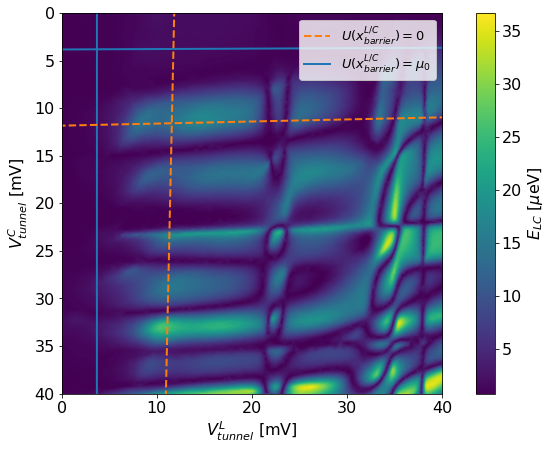

In [226]:
fig, ax = plt.subplots(figsize=(12, 7))

p = ax.imshow(1e6*data_LC_tunnels[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*tunel_max, 1e3*tunel_min))
ax.set_ylabel(r'$V_{tunnel}^{C}$ [mV]')
ax.set_xlabel(r'$V_{tunnel}^{L}$ [mV]')
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]')

x = np.array([0, 40])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-5)
crossings_R_0 = tunnel_crossing(learner, mu=0, index=2, tol=1e-5)

crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=1e-5)
crossings_R_mu = tunnel_crossing(learner, mu=-mu, index=2, tol=1e-5)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[-1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[-1])
ax.plot(x, f_L_0(x), label=r'$U(x^{L/C}_{barrier}) = 0$', color='C1', lw=2, linestyle='--')
ax.plot(x, f_L_mu(x), label=r'$U(x^{L/C}_{barrier}) = \mu_0$', color='C0', lw=2)

#ax.plot(f_L_0(x), x, label=r'$V_L = 0$', color='orange', lw=2)
#ax.plot(f_L_mu(x), x, label=r'$V_L = \mu_0$', color='red', lw=2)

f_R_0 = f_line(1e3*crossings_R_0[0], 1e3*crossings_R_0[-1])
f_R_mu = f_line(1e3*crossings_R_mu[0], 1e3*crossings_R_mu[-1])
ax.plot(f_L_0(x), x, color='C1', lw=2, linestyle='--')
ax.plot(x, f_R_mu(x), color='C0', lw=2)

ax.set_ylim(40, 0)
ax.set_xlim(0, 40)

ax.legend(fontsize=13, loc='upper right')
plt.savefig('../data/manuscript/device_2_LC_barriers.pdf', bbox_inches='tight')

### Plunger vs far tunel gate

In [242]:
voltage_setup_LC = get_voltage_setup_LC()
voltage_setup_LC['left_tunel'] = 17e-3
voltage_setup_LC['top_tunel'] = 17e-3
voltage_setup_LC['plunger_gate'] = 0.005
voltage_setup_LC

OrderedDict([('left_screen_triangle', -0.015),
             ('right_screen_triangle', -0.015),
             ('central_screen_gate', -0.0225),
             ('left_screen_side', -0.015),
             ('right_screen_side', -0.015),
             ('left_screen', -0.015),
             ('right_screen', -0.015),
             ('top_tunel', 0.017),
             ('left_tunel', 0.017),
             ('right_tunel', -0.02),
             ('plunger_gate', 0.005)])

In [243]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='left_screen_triangle',
                              val_1=v_plunger, 
                              key_2='right_screen_triangle',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [244]:
%%time
f((0,0))

CPU times: user 1.29 s, sys: 105 ms, total: 1.39 s
Wall time: 1.39 s


{'eigenvalues': 2.5015569876000875e-06,
 'potential': array([-0.00904738,  0.00240385,  0.00665706])}

In [245]:
screen_min = -40e-3
screen_max = 10e-3

In [53]:
cluster.scale(n=40)

In [246]:
data_LC = []
_learner = adaptive.Learner2D(f, bounds=[(screen_min, screen_max), (screen_min, screen_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.003, executor=client)

In [247]:
runner.live_info()

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x7f7ccad51160>>, <Future finished exception=InvalidStateError('CANCELLED: <Future at 0x7f7c9f721550 state=cancelled>')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line 775, in run
    yielded = self.gen.send(value)
  File "/opt/conda/lib/python3.9/site-packages/distributed/cfexecutor.py", line 22, in _cascade_future
    cf_future.set_result(result)
  File "/opt/conda/lib/python3.9/concurrent/futures/_base.py", line 533, in set_result
    raise InvalidStateError('{}: {!r}'.format(self._state, self))
concurrent.futures._base.InvalidStateErro

In [248]:
_, _, z = learner.interpolated_on_grid()
data_LC.append(z)

In [249]:
data_LC[0].shape

(711, 711)

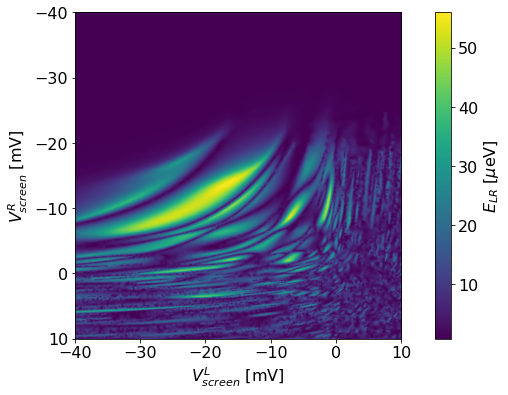

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.9/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1129)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_handshak

In [254]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LC[0],
              extent=(1e3*screen_min, 1e3*screen_max, 1e3*screen_max, 1e3*screen_min))
ax.set_ylabel(r'$V_{screen}^R$ [mV]')
ax.set_xlabel(r'$V_{screen}^L$ [mV]')
cb = plt.colorbar(p, ax=ax)

cb.set_label(r'$E_{LR}$ [$\mu$eV]')
plt.savefig('../data/manuscript/device_2_LC_screens.pdf', bbox_inches='tight')

# Plunger gate dependence

In [857]:
voltage_setup = get_voltage_setup_LC()

In [858]:
key = 'plunger_gate'
volts = np.linspace(0.003, 0.0084, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

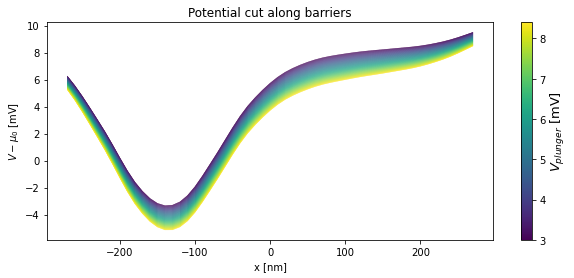

In [859]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu, color_label=r'$V_{plunger}$ [mV]')

In [268]:
key = 'plunger_gate'
volts = np.linspace(3e-3, 7e-3, 100)

In [269]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(phi2=max_phis[1])

In [270]:
voltage_setup = get_voltage_setup_LC()
voltage_setup['left_screen_triangle'] = -20e-3
voltage_setup['right_screen_triangle'] = -10e-3
voltage_setup['left_tunel'] = 17.5e-3
voltage_setup['center_tunel'] = 17.5e-3
voltage_setup

OrderedDict([('left_screen_triangle', -0.02),
             ('right_screen_triangle', -0.01),
             ('central_screen_gate', -0.0225),
             ('left_screen_side', -0.015),
             ('right_screen_side', -0.015),
             ('left_screen', -0.015),
             ('right_screen', -0.015),
             ('top_tunel', 0.022),
             ('left_tunel', 0.0175),
             ('right_tunel', -0.02),
             ('plunger_gate', 0.006),
             ('center_tunel', 0.0175)])

In [271]:
n = 20

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               key=key,
                               n=n,
                               eigenvecs=False)


def wrapper(arg):
    return solver(*arg)


args = list(it.product(volts, [params]))
args_db = db.from_sequence(args, npartitions=20)

In [272]:
result = args_db.map(wrapper).compute()

In [273]:
ens, wfs = separate_energies_wfs(result)

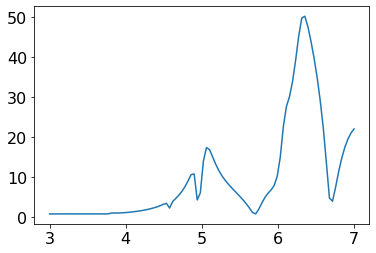

In [274]:
peaks, gs_LC = find_resonances(energies=ens,
                               n=n,
                               i=2,
                               n_peaks=5,
                               prominence=25e-6)


plt.plot(1e3*volts, 1e6*gs_LC)
